In [1]:
from moseq2_detectron_extract.io.session import Session
import matplotlib.pyplot as plt
import numpy as np
import cv2
import seaborn as sns

from moseq2_detectron_extract.proc.proc import prep_raw_frames, clean_frames, get_frame_features, scale_raw_frames
from moseq2_detectron_extract.proc.hha_encode_reference import getHHA, getCameraParam
from moseq2_detectron_extract.proc.roi import plane_ransac, apply_roi
from scipy import signal
from scipy import ndimage
import math
from mpl_toolkits.axes_grid1 import ImageGrid
import itertools

In [3]:
session = Session(r"E:\moseq_raw_data\detectron2_testing_full\session_20200915132521\depth.dat")
first_frame, bground_im, roi, true_depth = session.find_roi()
crop_bground_im = apply_roi(bground_im[None,:,:], roi)[0]

In [4]:
def plot_frames(frames, idxs, cols=5, fig_size=(20,20), vmin=0, vmax=100, features=None):
    cols = int(cols)
    rows = int(np.ceil(frames.shape[0] / cols))
    fig, axs = plt.subplots(rows, cols, sharex=True, sharey=True, figsize=fig_size)
    
    for i, ax in enumerate(axs.flat):
        ax.imshow(frames[i], vmin=vmin, vmax=vmax)
        if features is not None:
            feat = features[i]
            # draw the centroid as a point
            ax.scatter(feat['centroid'][0], feat['centroid'][1], c='r')
            # draw the orientation as an arrow
            r = 5
            dx = r * np.cos(feat['orientation'])
            dy = r * np.sin(feat['orientation'])
            ax.arrow(feat['centroid'][0], feat['centroid'][1], dx, dy, width=5)
        ax.set_title(idxs[i])
    fig.tight_layout()

def plot_tri_channel(frame, labels=None):
    if labels is None:
        labels = []

    fig = plt.figure(figsize=(24, 6))
    grid = ImageGrid(fig, 111, nrows_ncols=(1, 4), cbar_mode='each', axes_pad=0.4, share_all=True,)

    for i, (ax, cax, label) in enumerate(itertools.zip_longest(grid, grid.cbar_axes, labels, fillvalue="")):
        if i < 3:
            im = ax.imshow(frame[:, :, i])
            cax.colorbar(im)
        else:
            im = ax.imshow(frame)

        ax.set_title(label)

def plot_multi_tri_channel(frames, labels=None):
    if labels is None:
        labels = []

    nframes = frames.shape[0]
    fig = plt.figure(figsize=(24, 6 * nframes))
    grid = ImageGrid(fig, 111, nrows_ncols=(1 * nframes, 4), cbar_mode='each', axes_pad=0.4, share_all=True,)

    for i, (ax, cax, label) in enumerate(itertools.zip_longest(grid, grid.cbar_axes, labels, fillvalue="")):
        row = i // 4
        channel = i % 4
        if channel < 3:
            im = ax.imshow(frames[row, :, :, channel])
            cax.colorbar(im)
        else:
            im = ax.imshow(frames[row])

        ax.set_title(label)

In [35]:
frames_of_interest = range(18520, 18545)
frame_idxs, raw_frames = next(session.sample(25))
bg_sub_raw_frames = prep_raw_frames(raw_frames.copy(), bground_im=bground_im.copy(), roi=roi, vmin=0, vmax=100)
raw_frames = prep_raw_frames(raw_frames, bground_im=None, roi=roi, vmin=None, vmax=None, dtype='uint16')
print(frame_idxs)


[30223, 4304, 1796, 3003, 7209, 305, 17480, 13400, 285, 2372, 2751, 11435, 25877, 17496, 26874, 35591, 23025, 2718, 35339, 13800, 21976, 13174, 33156, 2600, 12256]


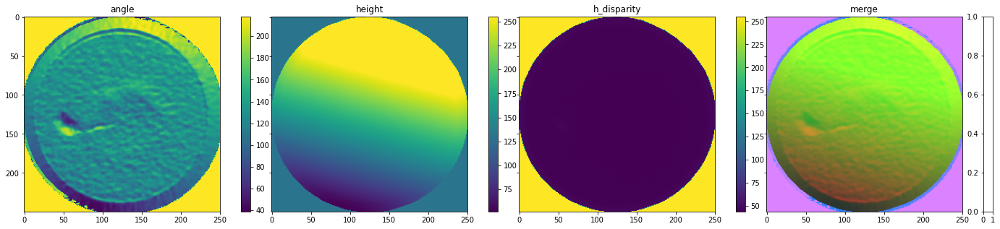

In [36]:
camera_matrix = getCameraParam('depth')
o_impl_hha = getHHA(camera_matrix, raw_frames[0], raw_frames[0])
plot_tri_channel(o_impl_hha, labels=['angle', 'height', 'h_disparity', 'merge'])

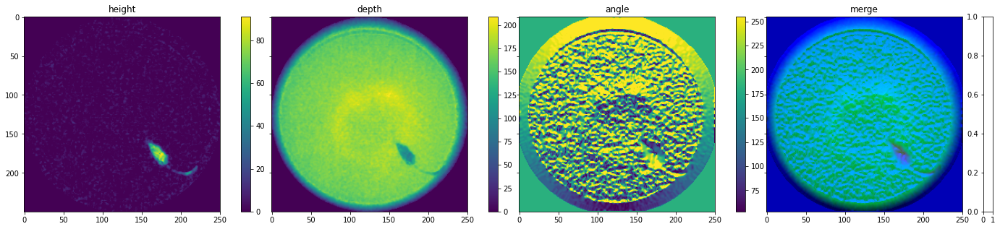

In [12]:
class HHAEncoder2():
    def __init__(self, background, gradient_filter=7):
        self.background = background
        self.gradient_filter = gradient_filter

    def rotation_matrix_from_vectors(self, vec1, vec2):
        """ Find the rotation matrix that aligns vec1 to vec2
        :param vec1: A 3d "source" vector
        :param vec2: A 3d "destination" vector
        :return mat: A transform matrix (3x3) which when applied to vec1, aligns it with vec2.
        """
        a, b = (vec1 / np.linalg.norm(vec1)).reshape(3), (vec2 / np.linalg.norm(vec2)).reshape(3)
        v = np.cross(a, b)
        c = np.dot(a, b)
        s = np.linalg.norm(v)
        kmat = np.array([[0, -v[2], v[1]], [v[2], 0, -v[0]], [-v[1], v[0], 0]])
        rotation_matrix = np.eye(3) + kmat + kmat.dot(kmat) * ((1 - c) / (s ** 2))
        return rotation_matrix


    def compute_normals(self, frame, fix_rot=False):
        # https://stackoverflow.com/questions/53350391/surface-normal-calculation-from-depth-map-in-python

        zy, zx = np.gradient(frame)
        # You may also consider using Sobel to get a joint Gaussian smoothing and differentation
        # to reduce noise
        if self.gradient_filter is not None:
            zx = cv2.Sobel(frame, cv2.CV_64F, 1, 0, ksize=self.gradient_filter)
            zy = cv2.Sobel(frame, cv2.CV_64F, 0, 1, ksize=self.gradient_filter)

        normal = np.dstack((-zx, -zy, np.ones_like(frame)))
        n = np.linalg.norm(normal, axis=2)
        normal[:, :, 0] /= n
        normal[:, :, 1] /= n
        normal[:, :, 2] /= n

        # # offset and rescale values to be in 0-255
        # normal += 1
        # normal /= 2
        # #normal *= 255

        if fix_rot:
            # align to estimated level
            plane, _ = plane_ransac(frame.astype(float), depth_range=(0, 300), mask=(frame>0))
            R = self.rotation_matrix_from_vectors(plane[:3], [1, 0, 0])
            normal = normal.reshape((-1, 3))
            normal = np.apply_along_axis(R.dot, axis=1, arr=normal)
            normal = normal.reshape((*frame.shape, 3))

        # estimate angle relative to some reference
        tmp = np.multiply(normal, np.array([0, 1, 0]))
        acosValue = np.minimum(1, np.maximum(-1, np.sum(tmp, axis=2)))
        angle = np.rad2deg(np.arccos(acosValue.flatten()))
        angle = (angle + 128 - 90)
        angle = angle.reshape(frame.shape)

        return angle

    def compute_height(self, frame):
        h = -frame
        yMin = np.percentile(h[h > 0], 0)
        h = h - yMin
        h[h < 0] = 0
        return h

    def compute_hdisparity(self, frame):
        return self.background - frame

    def encode(self, frame):
        angles = self.compute_normals(frame)
        angles = scale_raw_frames(angles, 0, 180)

        height = self.compute_height(-frame)
        height = scale_raw_frames(height, 0, 100)

        #hdisp = compute_height(-frame)
        hdisp = self.compute_hdisparity(frame)
        hdisp = scale_raw_frames(hdisp, 0, 100)
        #print(angles.shape, angles.dtype, angles.min(), angles.max())
        #print(height.shape, height.dtype, height.min(), height.max())
        #print(hdisp.shape, hdisp.dtype, hdisp.min(), hdisp.max())
        #return np.stack((angles, height, hdisp), axis=2)
        return np.stack((hdisp, height, angles), axis=2)

encoder2 = HHAEncoder2(crop_bground_im, gradient_filter=7)
plot_tri_channel(encoder2.encode(raw_frames[0]), labels=['height', 'depth', 'angle', 'merge'])

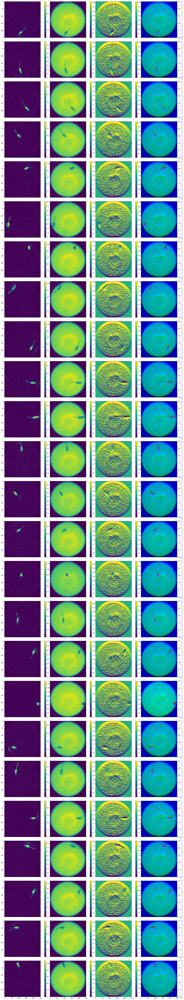

In [8]:
hha_frames = []
for rf in raw_frames:
    hha_frames.append(encoder2.encode(rf))

plot_multi_tri_channel(np.array(hha_frames))


In [9]:
%prun encoder2.encode(raw_frames[0])

         260 function calls (244 primitive calls) in 0.009 seconds

   Ordered by: internal time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.003    0.003    0.007    0.007 1710658854.py:21(compute_normals)
        5    0.001    0.000    0.001    0.000 {method 'reduce' of 'numpy.ufunc' objects}
        2    0.001    0.000    0.001    0.000 {Sobel}
        1    0.001    0.001    0.001    0.001 function_base.py:814(gradient)
     23/7    0.001    0.000    0.004    0.001 {built-in method numpy.core._multiarray_umath.implement_array_function}
        3    0.001    0.000    0.001    0.000 proc.py:208(scale_raw_frames)
        1    0.001    0.001    0.001    0.001 linalg.py:2363(norm)
        5    0.000    0.000    0.000    0.000 {method 'astype' of 'numpy.ndarray' objects}
        1    0.000    0.000    0.009    0.009 1710658854.py:69(encode)
        1    0.000    0.000    0.001    0.001 1710658854.py:59(compute_height)
        1    0.000    0.000 

In [10]:
%%timeit -n 1000 -r 3
encoder2.encode(raw_frames[0])

5.99 ms ± 128 µs per loop (mean ± std. dev. of 3 runs, 1000 loops each)


(250, 251)
(250, 250)
(250,)
(251, 251)


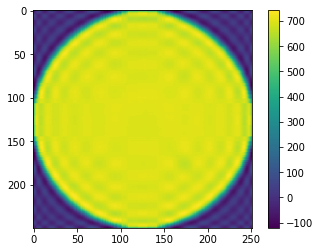

In [19]:
u,s,v = np.linalg.svd(raw_frames[0])
n = 10
S = np.zeros(np.shape(raw_frames[0]))
for i in range(0, n):
    S[i,i] = s[i]
print(raw_frames[0].shape)
print(u.shape)
print(s.shape)
print(v.shape)
plt.imshow(u @ S @ v)
plt.colorbar()

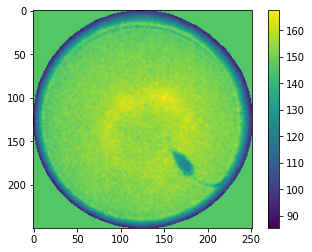

In [32]:
from sklearn.decomposition import PCA

pca = PCA(1)
data = pca.fit_transform(raw_frames[0].reshape(-1, 1))
data = data.reshape(raw_frames[0].shape)
data[data > 0] = np.mean(data[data < 0])
data = np.abs(data)
plt.imshow(data)
plt.colorbar()

c:\Users\Josh\anaconda3\envs\moseq-detectron\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

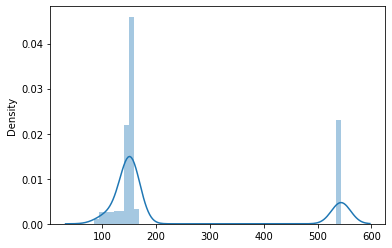

In [31]:
sns.distplot(data)